# Group Project - Group 3 - UK Police - reported Crimes in London

## Setting the environment

We will import findspark to find the spark module in obsdet VM and use it with Jupyter

In [1]:
import findspark

# Findspark will help Jupyter Notebook find Spark within OSBDET
findspark.init()

In [2]:
import pandas as pd

pd.set_option('display.max_colwidth', None)


Initiating **Spark Session** referencing this notebook as entry-point

In [3]:
from pyspark.sql.session import SparkSession

spark_session = \
  SparkSession.builder\
              .appName("#Group Project - Group 3")\
              .getOrCreate()

print(f"This cluster relies on Spark '{spark_session.version}'")

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


This cluster relies on Spark '3.2.3'


In [4]:
from pyspark.sql.types import StructType, ArrayType
import pyspark.sql.functions as F

## Joining .JSON Files Pre-processing

Our approach is a bit different due to the API limitations. We will comment each file directory in HDFS and make a for loop to proccess and merge each file.

In [5]:
file_paths = [
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/shoplifting.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/possession-of-weapons.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/bicycle-theft.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/robbery.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/anti-social-behaviour.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/burglary.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/public-order.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/drugs.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/criminal-damage-arson.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/violent-crime.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/theft-from-the-person.json',
    'hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/vehicle-crime.json'
]

We need to make the file ready to see them together, or just use the all_crime.json. For the sake of being ordered, we will make a for loop going through every .json file the API extracted. After that we will extract the features using our spark_session, **flattening the files**

In [6]:

dataframes = []

for element in file_paths:
    df = spark_session.read.json(element)
    
    df_selected = df.select(
        F.col('id').alias('crime_id'),
        F.col('category').alias('crime_type'),
        F.col('month').alias('incident_month'),
        F.col('location.latitude').alias('latitude'),
        F.col('location.longitude').alias('longitude'),
        F.col('location.street.name').alias('street_name')
    )
    dataframes.append(df_selected)

**Now, we do another for loop and merge them together**

In [7]:
# Merge all dataframes into a single dataframe using union
merged_df = dataframes[0]
for df in dataframes[1:]:
    merged_df = merged_df.union(df)

Let's display the schema and translate the merged dataframe into Pandas!

In [8]:
# Displaying the structure and some rows of the merged dataframe
merged_df.printSchema()

merged_df\
    .limit(10).toPandas()


root
 |-- crime_id: long (nullable = true)
 |-- crime_type: string (nullable = true)
 |-- incident_month: string (nullable = true)
 |-- latitude: string (nullable = true)
 |-- longitude: string (nullable = true)
 |-- street_name: string (nullable = true)



,crime_id,crime_type,incident_month,latitude,longitude,street_name
0,113817032,shoplifting,2023-10,51.514586,-0.152839,On or near Shopping Area
1,113880702,shoplifting,2023-10,51.512544,-0.145989,On or near Avery Row
2,113860497,shoplifting,2023-10,51.511893,-0.144070,On or near New Bond Street
3,113842744,shoplifting,2023-10,51.513350,-0.159461,On or near Marble Arch
4,113847514,shoplifting,2023-10,51.512326,-0.187879,On or near Bayswater
5,113835626,shoplifting,2023-10,51.513848,-0.129593,On or near Old Compton Street
6,113883092,shoplifting,2023-10,51.509592,-0.197729,On or near Bulmer Mews
7,113854698,shoplifting,2023-10,51.516295,-0.129487,On or near Conference/exhibition Centre
8,113874947,shoplifting,2023-10,51.514970,-0.127169,On or near Shaftesbury Avenue
9,113872097,shoplifting,2023-10,51.518567,-0.132282,On or near B506


In case we inserted duplicates in the frame while merging and re-executing. **This will drop duplicate crime ids**

In [9]:
merged_df.drop_duplicates() 

DataFrame[crime_id: bigint, crime_type: string, incident_month: string, latitude: string, longitude: string, street_name: string]

## Exploratory Data Analysis Phase (EDA) - Types and Places

So we have **5202 crimes in 2023 October for the researched area which is the most "turisty" area of London**, Not Bad!

In [42]:
merged_df.count() 

5202

So **theft from person** is a very recurrent crime compared to others. We are also suprised to see this many violent crimes

In [10]:
crime_count_by_type = merged_df.groupBy("crime_type").count().orderBy("count", ascending=False)

crime_count_by_type.show(truncate=False)


+---------------------+-----+
|crime_type           |count|
+---------------------+-----+
|theft-from-the-person|2197 |
|violent-crime        |697  |
|anti-social-behaviour|671  |
|shoplifting          |382  |
|public-order         |314  |
|robbery              |230  |
|vehicle-crime        |221  |
|burglary             |142  |
|drugs                |140  |
|criminal-damage-arson|107  |
|bicycle-theft        |78   |
|possession-of-weapons|23   |
+---------------------+-----+



Looks like many of these crimes occur at **Nightclubs and Theatres...**

In [11]:
crime_count_by_street = merged_df.groupBy("street_name").count().orderBy("count", ascending=False)

crime_count_by_street.show(truncate=False)

+----------------------------------------------+-----+
|street_name                                   |count|
+----------------------------------------------+-----+
|On or near Nightclub                          |555  |
|On or near Theatre/concert Hall               |277  |
|On or near Shopping Area                      |260  |
|On or near Parking Area                       |240  |
|On or near Further/higher Educational Building|171  |
|On or near Hills Place                        |92   |
|On or near Argyll Street                      |86   |
|Paddington (station)                          |74   |
|On or near Conference/exhibition Centre       |62   |
|On or near Dering Street                      |59   |
|Tottenham Court Road (lu Station)             |51   |
|On or near Old Compton Street                 |46   |
|On or near Supermarket                        |46   |
|On or near John Prince's Street               |46   |
|On or near Leicester Street                   |45   |
|On or nea

We are now going to make bins and a heatmap. **Particularly good with categorical variables, it will give us some hidden insights on what is going on.**

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:

# Calculate the total crimes per street
total_crimes_per_street = merged_df\
                            .groupBy("street_name")\
                            .count()\
                            .orderBy("count", ascending=False).limit(20)

# Join with the original dataset to filter only crimes in top 20 streets
filtered_data = merged_df\
                    .join(total_crimes_per_street, "street_name")

# Now group by crime_type and street_name
crime_counts = filtered_data\
                    .groupBy("crime_type", "street_name").count()

# Convert to Pandas DataFrame for plotting
crime_counts_pd = crime_counts.toPandas()

crime_counts_pd


,crime_type,street_name,count
0,shoplifting,On or near Hills Place,14
1,shoplifting,On or near Further/higher Educational Building,5
2,shoplifting,Paddington (station),16
3,shoplifting,On or near Conference/exhibition Centre,3
4,shoplifting,On or near Theatre/concert Hall,16
...,...,...,...
160,vehicle-crime,On or near Parking Area,66
161,vehicle-crime,On or near Weighhouse Street,1
162,vehicle-crime,Paddington (station),1
163,vehicle-crime,On or near Theatre/concert Hall,3


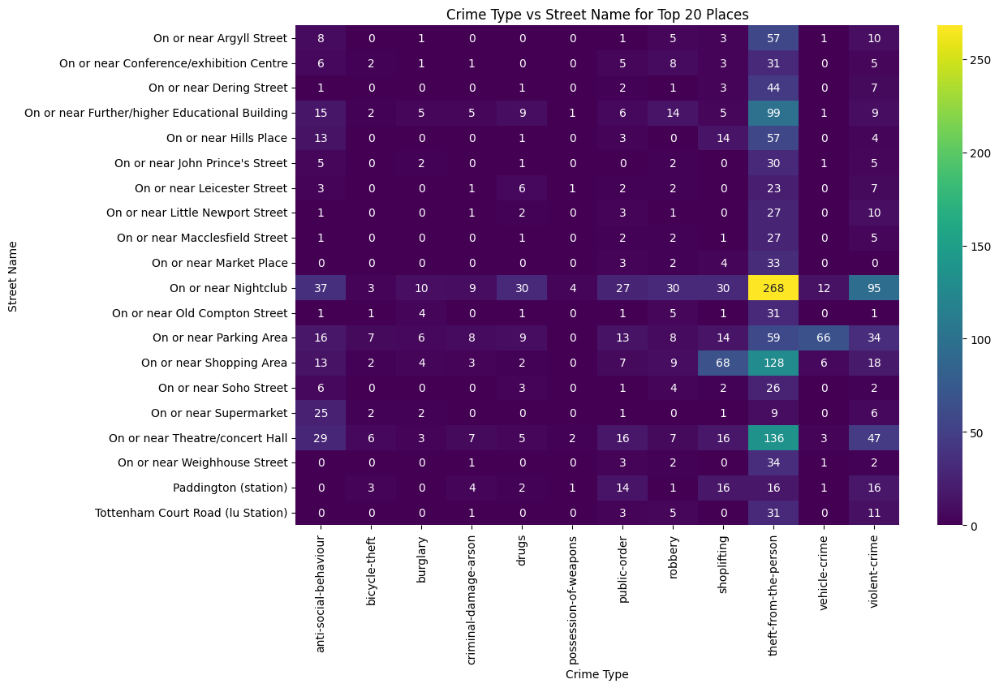

In [56]:

# Pivoting for heatmap
pivot_table = crime_counts_pd.pivot(index="street_name", columns="crime_type", values="count").fillna(0)

# Plotting
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="viridis")
plt.title("Crime Type vs Street Name for Top 20 Places")
plt.xlabel("Crime Type")
plt.ylabel("Street Name")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

**So it looks like 268 crimes happen at nightclubs and are thefts. Did the police caught the suspect? Does not seem like it, but it is still very soon**

In [13]:
df = spark_session.read.json('hdfs://localhost:9000/datalake/raw/crimes/area/crime_category/theft-from-the-person.json')


In [77]:
filtered_df = df\
                .filter((F.col("category") == "theft-from-the-person") & (F.col("location.street.name") == "On or near Nightclub"))


outcome_counts = filtered_df\
                    .groupBy("outcome_status")\
                    .count()
outcome_counts.toPandas()


,outcome_status,count
0,"(Local resolution, 2023-10)",1
1,"(Awaiting court outcome, 2023-10)",1
2,"(Under investigation, 2023-10)",104
3,"(Investigation complete; no suspect identified, 2023-10)",162


In fact, using our brute-force extraction of ALL CRIME, most crimes dont get the suspect identified **but some give the offender a penalty or a court outcome!** Since this data is from october, many are still under investigation.

In [79]:
allcrime = spark_session.read.json('hdfs://localhost:9000/datalake/raw/crimes/area/all-crime/all_crime.json')


outcome_counts = allcrime.groupBy("outcome_status", "category").count().orderBy("count", ascending=False)
outcome_counts.toPandas()


,outcome_status,category,count
0,"(Investigation complete; no suspect identified, 2023-10)",theft-from-the-person,1254
1,"(Investigation complete; no suspect identified, 2023-10)",other-theft,1014
2,"(Under investigation, 2023-10)",theft-from-the-person,938
3,"(Under investigation, 2023-10)",other-theft,923
4,None,anti-social-behaviour,671
5,"(Under investigation, 2023-10)",violent-crime,549
6,"(Under investigation, 2023-10)",public-order,225
7,"(Investigation complete; no suspect identified, 2023-10)",shoplifting,186
8,"(Under investigation, 2023-10)",shoplifting,181
9,"(Under investigation, 2023-10)",robbery,173


## Exploratory Data Analysis Phase (EDA) II - Geo JSON MAPS

Ok, thefts might be enmasking the information of other crimes geographically as they are 42% of all crimes....

In fact, when I paint the map (we will use Folium, a package that integrates the well-known Leaflet with Python), we are getting too much information.

In [19]:
# pip install folium

In [25]:
import folium

In [26]:
pandas_df = merged_df.select('latitude', 'longitude', 'crime_type').toPandas()


pandas_df.dropna(subset=['latitude', 'longitude'], inplace=True)

pandas_df['latitude'] = pandas_df['latitude'].astype(float)
pandas_df['longitude'] = pandas_df['longitude'].astype(float)


crime_map = folium.Map(location=[pandas_df['latitude'].mean(), pandas_df['longitude'].mean()], zoom_start=12)


# Add points to the map
for idx, row in pandas_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        popup=row['crime_type'],
        fill=True
    ).add_to(crime_map)

# Display the map
crime_map

Ok, this next map is much better with MarkerCluster. I now know that the most dangerous zone is near Soho!!

In [27]:
from folium.plugins import MarkerCluster

In [28]:
# Create a map
crime_map = folium.Map(location=[pandas_df['latitude'].mean(), pandas_df['longitude'].mean()], zoom_start=12)

# Create a MarkerCluster object
marker_cluster = MarkerCluster().add_to(crime_map)

# Add points to the cluster
for idx, row in pandas_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['crime_type'],
    ).add_to(marker_cluster)

# Display the map
crime_map

Let's dissect. For every crime, we will only plot a category! **We inmmediately see some insights this way!**

In [29]:
unique_crime_types = pandas_df['crime_type'].unique()

# Dictionary to store maps
crime_maps = {}

# Create a map for each crime type
for crime_type in unique_crime_types:
    # Filter for a specific crime type
    filtered_df = pandas_df[pandas_df['crime_type'] == crime_type]

    # Create a map centered around the average coordinates
    crime_map = folium.Map(location=[filtered_df['latitude'].mean(), filtered_df['longitude'].mean()], zoom_start=12)

    # Add markers to the map
    for idx, row in filtered_df.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=crime_type,
            icon=folium.Icon(icon='circle', color='blue')
        ).add_to(crime_map)

    # Store the map in the dictionary
    crime_maps[crime_type] = crime_map

#burglary
#theft-from-the-person
#violent-crime
#anti-social-behaviour
#shoplifting
#public-order
#robbery
#vehicle-crime      
#burglary           
#drugs             
#criminal-damage-arson
#bicycle-theft
#possession-of-weapons

In [30]:
crime_maps['drugs']

In [31]:
crime_maps['bicycle-theft']

In [32]:
crime_maps['burglary']

In [33]:
crime_maps['vehicle-crime']

In [34]:
crime_maps['possession-of-weapons']